
# Прогноз активности катализатора

Прогноз активности катализатора
На одном из предприятий СИБУР действует установка полимеризации пропилена. Ее основной продукт - гомополимер пропилена. В этой задаче вы должны построить прогноз активности катализатора, который используется в процессе полимеризации. Для решения задачи вам доступны исторические данные о работе установки.

Целевой переменной в этой задаче является активность катализатора, а прогноз должен строиться на 6 часов вперед.

В работе установки в тестовый период было несколько остановов. Активность во время остановов и сразу после них предсказывать не нужно, а точный набор временных меток, для которых необходимо построить прогноз, доступен в файле activity_test_timestamps.csv.

Данные
Установка полимеризации пропилена

Установка полимеризации пропилена – технологический комплекс, предназначенный для получения порошка гомополимера пропилена.

Полимеризация осуществляется в каскаде из трех изотермических реакторов идеального перемешивания непрерывного действия в растворе в среде тяжелого растворителя (нефраса). Технологическим предшественником реакторного блока является блок приготовления катализаторного комплекса с форполимеризацией (емкости D1 и D2).

Два первичных реактора (R1 и R2) работают параллельно и независимо. Реакционная среда из них в постоянном режиме перегружается в общий вторичный реактор (R3), где происходит дополимеризация.

В процессе используется катализатор, активность которого нужно прогнозировать в этой задаче.

Исторические данные о работе установки для тренировочного периода содержатся в файле activity_train.csv.zip, а для тестового - в файле activity_test.csv.zip.

Базовое решение
Простой baseline доступен в ноутбуке Baseline - Polypropylene.ipynb. Он воспроизводит тривиальное решение activity_naive_baseline.csv (последнее известное значение тренировочного периода) и создает решение на основе простой нейронной сети.

### Уважаемые организаторы! 
Данный ноутбук лучше проверять на более мощном оборудовании  - время выполнения кода на обычном ПК около 
#### 2 - 3 часов.

In [1035]:
import numpy as np

import pandas as pd

import seaborn as sns

from sklearn import linear_model, metrics
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, KFold, TimeSeriesSplit, \
                                    cross_val_score, GridSearchCV, RandomizedSearchCV

from sklearn.ensemble import GradientBoostingRegressor

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.cbook as cbook
%matplotlib inline

In [1036]:
import warnings
warnings.filterwarnings('ignore')

In [1037]:
data = pd.read_csv('activity_train.csv', header = 0, sep = ',')
train_target = data[['date','activity']]

test_data = pd.read_csv('activity_test.csv', header = 0, sep = ',')
test_target = pd.read_csv('activity_test_timestamps.csv', header = 0, sep = ',')

In [1038]:
data.head(-1)

,date,f0,f1,f2,f3,f4,f5,f6,f7,f8,...,f50,f51,f52,f53,f54,f55,activity,atactic_1,atactic_2,atactic_3
0,2018-02-13 08:30:00,49.048771,294.933268,1.675466,0.000051,0.024688,0.001628,1.724180e+06,728860.217994,1.179884,...,342.95605,332.80826,332.81665,5493.318081,4829.339027,521.341026,33.998170,NaN,NaN,NaN
1,2018-02-13 08:31:00,49.007980,294.932866,1.675090,0.000051,0.024659,0.001633,1.724523e+06,729611.819621,1.179814,...,342.97174,332.82263,332.78198,5247.641087,5020.168781,520.791888,34.623659,NaN,NaN,NaN
2,2018-02-13 08:32:00,48.994400,294.932703,1.675766,0.000051,0.024727,0.001639,1.724582e+06,730361.831348,1.179867,...,342.97382,332.84164,332.82962,5000.878811,5207.399845,520.242810,33.969483,NaN,NaN,NaN
3,2018-02-13 08:33:00,48.970760,294.936968,1.675868,0.000051,0.024723,0.001641,1.724677e+06,730486.077321,1.186719,...,342.97943,332.88272,332.88680,4751.941204,5387.604237,521.320522,32.701220,NaN,NaN,NaN
4,2018-02-13 08:34:00,48.952991,294.935404,1.675002,0.000051,0.024708,0.001646,1.724621e+06,730061.574144,1.186838,...,342.98720,332.91257,332.90576,4513.198853,5566.278934,522.398114,32.337694,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
463052,2018-12-31 22:02:00,61.161781,294.757288,1.637639,0.000052,0.020062,0.001898,1.716052e+06,735002.420773,2.794225,...,343.02667,333.08267,333.03146,706.312776,520.087779,10581.179619,32.517634,NaN,NaN,NaN
463053,2018-12-31 22:03:00,61.140079,294.753064,1.637785,0.000052,0.020075,0.001891,1.716194e+06,735534.522740,2.794532,...,343.00870,333.08606,333.04095,925.620794,520.087779,10581.179619,47.456124,NaN,NaN,NaN
463054,2018-12-31 22:04:00,61.088779,294.737276,1.637921,0.000052,0.019897,0.001883,1.716121e+06,734669.710913,2.794240,...,343.01242,333.10956,333.09244,1134.474993,520.087779,10581.179619,45.240556,NaN,NaN,NaN
463055,2018-12-31 22:05:00,61.085320,294.741612,1.637555,0.000052,0.019976,0.001879,1.715689e+06,734060.031202,2.794521,...,343.00293,333.14926,333.11444,1345.754981,520.087779,10581.179619,45.389704,NaN,NaN,NaN


In [1039]:
data.corr()

,f0,f1,f2,f3,f4,f5,f6,f7,f8,f9,...,f50,f51,f52,f53,f54,f55,activity,atactic_1,atactic_2,atactic_3
f0,1.000000e+00,2.227943e-02,4.807195e-03,-1.409209e-02,7.146003e-02,-3.302525e-02,-3.187631e-04,-6.741194e-03,-3.761355e-02,-1.731443e-02,...,1.587796e-02,-6.148805e-03,-5.894637e-03,1.717249e-03,-2.964727e-03,6.255058e-03,-5.547444e-02,-1.690797e-02,-1.464644e-02,-4.710922e-02
f1,2.227943e-02,1.000000e+00,-1.227215e-01,-9.665950e-02,1.425017e-01,-1.786963e-01,-1.806407e-01,-6.887442e-02,-2.510198e-01,-1.299715e-01,...,1.246004e-01,-2.099569e-02,-1.232464e-02,1.359333e-04,-4.764733e-03,-8.729182e-03,-1.178519e-01,7.431732e-02,5.638002e-02,-4.565610e-02
f2,4.807195e-03,-1.227215e-01,1.000000e+00,5.720315e-01,1.011718e-01,9.303392e-02,-6.813032e-02,1.382499e-01,-8.554071e-02,2.356213e-01,...,-1.109590e-03,-2.170591e-01,-2.196230e-01,-8.586977e-03,-6.674807e-03,9.571325e-04,4.168056e-02,6.265692e-02,8.434231e-02,1.303298e-01
f3,-1.409209e-02,-9.665950e-02,5.720315e-01,1.000000e+00,1.419906e-01,2.366704e-01,-1.262089e-01,1.528138e-01,3.489486e-02,4.785310e-01,...,7.705233e-02,8.567255e-04,6.677181e-04,-1.282129e-03,-1.142460e-02,9.366655e-03,-1.190507e-02,2.042194e-01,2.709407e-01,2.682069e-01
f4,7.146003e-02,1.425017e-01,1.011718e-01,1.419906e-01,1.000000e+00,1.062850e-01,-3.180859e-01,2.260349e-01,-4.629021e-01,-1.184121e-01,...,3.728019e-02,1.591956e-01,1.681188e-01,-4.763550e-03,-5.249101e-03,-5.836944e-03,-6.912416e-01,3.646688e-01,3.329552e-01,3.002265e-01
f5,-3.302525e-02,-1.786963e-01,9.303392e-02,2.366704e-01,1.062850e-01,1.000000e+00,-1.868356e-01,9.725580e-02,3.289336e-01,5.104204e-01,...,-1.374800e-01,-1.536988e-01,-1.504486e-01,-5.924488e-03,-1.065939e-03,-9.406659e-03,-4.063102e-02,-1.551059e-02,3.687560e-02,1.351884e-01
f6,-3.187631e-04,-1.806407e-01,-6.813032e-02,-1.262089e-01,-3.180859e-01,-1.868356e-01,1.000000e+00,9.159291e-02,9.437059e-02,-4.309339e-02,...,6.153945e-04,2.290280e-01,2.228166e-01,-2.183134e-03,5.869875e-03,-1.568448e-03,2.108731e-01,-2.956297e-01,-2.387048e-01,-2.261241e-01
f7,-6.741194e-03,-6.887442e-02,1.382499e-01,1.528138e-01,2.260349e-01,9.725580e-02,9.159291e-02,1.000000e+00,-1.067441e-01,7.608532e-02,...,-5.960868e-02,3.401479e-01,3.414051e-01,-3.936930e-03,-7.207734e-04,2.558942e-03,-1.710890e-01,1.426796e-02,9.620199e-02,1.099649e-01
f8,-3.761355e-02,-2.510198e-01,-8.554071e-02,3.489486e-02,-4.629021e-01,3.289336e-01,9.437059e-02,-1.067441e-01,1.000000e+00,2.998304e-01,...,-3.909462e-02,-5.645027e-02,-6.631621e-02,-2.312592e-03,-3.825034e-03,7.291239e-03,3.516340e-01,-3.425766e-01,-3.200652e-01,-2.133398e-01
f9,-1.731443e-02,-1.299715e-01,2.356213e-01,4.785310e-01,-1.184121e-01,5.104204e-01,-4.309339e-02,7.608532e-02,2.998304e-01,1.000000e+00,...,-1.248851e-01,-1.886111e-01,-1.867860e-01,3.711611e-03,-6.999451e-03,-1.153321e-03,1.426736e-01,-3.904451e-02,5.240274e-02,8.856845e-02


In [1040]:
data.columns

Index(['date', 'f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9',
       'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19',
       'f20', 'f21', 'f22', 'f23', 'f24', 'f25', 'f26', 'f27', 'f28', 'f29',
       'f30', 'f31', 'f32', 'f33', 'f34', 'f35', 'f36', 'f37', 'f38', 'f39',
       'f40', 'f41', 'f42', 'f43', 'f44', 'f45', 'f46', 'f47', 'f48', 'f49',
       'f50', 'f51', 'f52', 'f53', 'f54', 'f55', 'activity', 'atactic_1',
       'atactic_2', 'atactic_3'],
      dtype='object')

In [1041]:
print(data.shape)

(463058, 61)


In [1042]:
data.isnull().values.any()

True

In [1043]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 463058 entries, 0 to 463057
Data columns (total 61 columns):
date         463058 non-null object
f0           317593 non-null float64
f1           317594 non-null float64
f2           317594 non-null float64
f3           317570 non-null float64
f4           317621 non-null float64
f5           317621 non-null float64
f6           317594 non-null float64
f7           317593 non-null float64
f8           317544 non-null float64
f9           317574 non-null float64
f10          317621 non-null float64
f11          317621 non-null float64
f12          317621 non-null float64
f13          317621 non-null float64
f14          317621 non-null float64
f15          317486 non-null float64
f16          317574 non-null float64
f17          317424 non-null float64
f18          317621 non-null float64
f19          316271 non-null float64
f20          317621 non-null float64
f21          317621 non-null float64
f22          317621 non-null float64
f2

In [1044]:
test_data.head(-1)

,date,f0,f1,f2,f3,f4,f5,f6,f7,f8,...,f46,f47,f48,f49,f50,f51,f52,f53,f54,f55
0,2019-01-01 00:30:00,57.132648,294.708041,1.636037,0.000052,0.019928,0.001852,1.716315e+06,743388.392658,2.989328,...,336.59200,336.64236,336.08533,336.16528,343.03546,333.43230,333.38052,522.152305,2178.483009,7568.408012
1,2019-01-01 00:31:00,57.119122,294.702589,1.635624,0.000052,0.019988,0.001874,1.715817e+06,741369.594337,2.989310,...,336.59048,336.64197,336.09860,336.19940,343.03375,333.41724,333.36392,522.445917,1944.569945,7747.926235
2,2019-01-01 00:32:00,57.079891,294.718029,1.634823,0.000052,0.019912,0.001874,1.716210e+06,743306.512832,2.989467,...,336.60050,336.64154,336.26498,336.40747,343.01495,333.37753,333.29938,523.043394,1710.854053,7923.093796
3,2019-01-01 00:33:00,57.057171,294.718260,1.636119,0.000052,0.019999,0.001885,1.715934e+06,741396.762914,2.989151,...,336.62912,336.67390,336.12607,336.23605,342.99408,333.36500,333.30533,523.640990,1476.246953,8097.620964
4,2019-01-01 00:34:00,57.040150,294.744400,1.635117,0.000052,0.020087,0.001895,1.716098e+06,744469.664631,2.989379,...,336.63336,336.69170,336.30340,336.46835,342.97284,333.34850,333.30220,524.238527,1239.382029,8269.639015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103645,2019-03-13 23:55:00,41.262711,297.065470,1.620805,0.000050,0.018178,0.001720,1.718697e+06,749144.203087,2.697327,...,337.16803,337.22522,336.32294,336.49387,342.98727,332.90726,332.86100,2931.128025,7159.153938,529.967010
103646,2019-03-13 23:56:00,41.258961,297.056250,1.621102,0.000050,0.018202,0.001719,1.718766e+06,748862.744107,2.697304,...,337.17264,337.22110,336.35090,336.50546,342.99280,332.90610,332.88840,2702.449083,7339.463234,530.357897
103647,2019-03-13 23:57:00,41.241711,297.040711,1.621177,0.000050,0.018296,0.001716,1.718952e+06,749385.259914,2.697264,...,337.15433,337.21300,336.49606,336.68085,342.98798,332.91803,332.87045,2470.097065,7518.649101,530.748785
103648,2019-03-13 23:58:00,41.206409,297.056219,1.621203,0.000050,0.018245,0.001717,1.718760e+06,749682.103511,2.697148,...,337.16860,337.22318,336.36996,336.50830,342.98706,332.92795,332.92300,2237.128973,7693.223000,531.103313


In [1045]:
test_target.shape

(85891, 1)

In [1046]:
test_target.head(-1)

,date
0,2019-01-01 00:30:00
1,2019-01-01 00:31:00
2,2019-01-01 00:32:00
3,2019-01-01 00:33:00
4,2019-01-01 00:34:00
...,...
85885,2019-03-13 23:55:00
85886,2019-03-13 23:56:00
85887,2019-03-13 23:57:00
85888,2019-03-13 23:58:00


In [1047]:
test_target.shape

(85891, 1)

In [1048]:
train_target

,date,activity
0,2018-02-13 08:30:00,33.998170
1,2018-02-13 08:31:00,34.623659
2,2018-02-13 08:32:00,33.969483
3,2018-02-13 08:33:00,32.701220
4,2018-02-13 08:34:00,32.337694
...,...,...
463053,2018-12-31 22:03:00,47.456124
463054,2018-12-31 22:04:00,45.240556
463055,2018-12-31 22:05:00,45.389704
463056,2018-12-31 22:06:00,45.542522


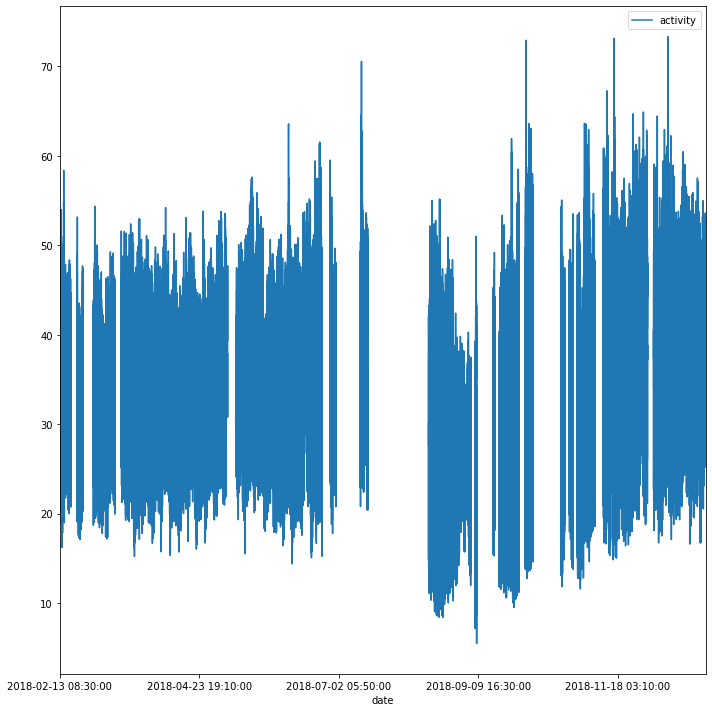

In [1049]:
plt.rcParams["figure.figsize"] = (10,10)

data.plot('date', 'activity')

# Rotate and align xtick labels
#ax.get_figure().autofmt_xdate()

# make room for tick labels
plt.tight_layout()


plt.show()

## Предобработка данных

In [1050]:
data.drop(['f28','activity', 'atactic_1', 'atactic_2', 'atactic_3'], axis=1, inplace=True)

In [1051]:
data_all = pd.concat([data, test_data.drop('f28', axis=1)])
data_all = data_all.reset_index(drop=True)

In [1052]:
data_all

,date,f0,f1,f2,f3,f4,f5,f6,f7,f8,...,f46,f47,f48,f49,f50,f51,f52,f53,f54,f55
0,2018-02-13 08:30:00,49.048771,294.933268,1.675466,0.000051,0.024688,0.001628,1.724180e+06,728860.217994,1.179884,...,335.67578,335.74625,336.91620,336.97977,342.95605,332.80826,332.81665,5493.318081,4829.339027,521.341026
1,2018-02-13 08:31:00,49.007980,294.932866,1.675090,0.000051,0.024659,0.001633,1.724523e+06,729611.819621,1.179814,...,335.66540,335.73734,336.98390,337.02980,342.97174,332.82263,332.78198,5247.641087,5020.168781,520.791888
2,2018-02-13 08:32:00,48.994400,294.932703,1.675766,0.000051,0.024727,0.001639,1.724582e+06,730361.831348,1.179867,...,335.63095,335.70050,336.97913,337.05157,342.97382,332.84164,332.82962,5000.878811,5207.399845,520.242810
3,2018-02-13 08:33:00,48.970760,294.936968,1.675868,0.000051,0.024723,0.001641,1.724677e+06,730486.077321,1.186719,...,335.57654,335.65533,337.00995,337.05280,342.97943,332.88272,332.88680,4751.941204,5387.604237,521.320522
4,2018-02-13 08:34:00,48.952991,294.935404,1.675002,0.000051,0.024708,0.001646,1.724621e+06,730061.574144,1.186838,...,335.53976,335.63748,337.05005,337.10764,342.98720,332.91257,332.90576,4513.198853,5566.278934,522.398114
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566704,2019-03-13 23:56:00,41.258961,297.056250,1.621102,0.000050,0.018202,0.001719,1.718766e+06,748862.744107,2.697304,...,337.17264,337.22110,336.35090,336.50546,342.99280,332.90610,332.88840,2702.449083,7339.463234,530.357897
566705,2019-03-13 23:57:00,41.241711,297.040711,1.621177,0.000050,0.018296,0.001716,1.718952e+06,749385.259914,2.697264,...,337.15433,337.21300,336.49606,336.68085,342.98798,332.91803,332.87045,2470.097065,7518.649101,530.748785
566706,2019-03-13 23:58:00,41.206409,297.056219,1.621203,0.000050,0.018245,0.001717,1.718760e+06,749682.103511,2.697148,...,337.16860,337.22318,336.36996,336.50830,342.98706,332.92795,332.92300,2237.128973,7693.223000,531.103313
566707,2019-03-13 23:59:00,41.181198,297.041621,1.620602,0.000050,0.018326,0.001719,1.717817e+06,748723.487612,2.697320,...,337.16907,337.21902,336.30716,336.38098,342.96680,332.92834,332.90158,2007.546902,7861.329079,531.130016


In [1053]:
data_all.shape

(566709, 56)

In [1054]:
#print(data['date'][100000])
#print(int(str(data['date'][100000])[-8:-6]))
#print(int(str(data['date'][100000])[-5:-3]))
#print((str(data['date'][100000])[0:4]))
#print((str(data['date'][100000])[5:7]))
#print((str(data['date'][100000])[8:10]))

In [1055]:
yearList =[]
for i in data_all['date']:
    yearList.append(int(str(i)[0:4]))
    
monthList =[]
for i in data_all['date']:
    monthList.append(int(str(i)[5:7]))
    
dayList =[]
for i in data_all['date']:
    dayList.append(int(str(i)[8:10]))
    
hourList =[]
for i in data_all['date']:
    hourList.append(int(str(i)[-8:-6]))
    
minuteList =[]
for i in data_all['date']:
    minuteList.append(int(str(i)[-5:-3]))

In [1056]:
data_all['Year'] = yearList
data_all['Month'] = monthList
data_all['Day'] = dayList
data_all['Hour'] = hourList
data_all['Minute'] = minuteList

In [1057]:
data_all.drop('date', axis=1, inplace=True)

In [1058]:
data_all.head(-1)

,f0,f1,f2,f3,f4,f5,f6,f7,f8,f9,...,f51,f52,f53,f54,f55,Year,Month,Day,Hour,Minute
0,49.048771,294.933268,1.675466,0.000051,0.024688,0.001628,1.724180e+06,728860.217994,1.179884,0.513442,...,332.80826,332.81665,5493.318081,4829.339027,521.341026,2018,2,13,8,30
1,49.007980,294.932866,1.675090,0.000051,0.024659,0.001633,1.724523e+06,729611.819621,1.179814,0.513436,...,332.82263,332.78198,5247.641087,5020.168781,520.791888,2018,2,13,8,31
2,48.994400,294.932703,1.675766,0.000051,0.024727,0.001639,1.724582e+06,730361.831348,1.179867,0.513290,...,332.84164,332.82962,5000.878811,5207.399845,520.242810,2018,2,13,8,32
3,48.970760,294.936968,1.675868,0.000051,0.024723,0.001641,1.724677e+06,730486.077321,1.186719,0.511677,...,332.88272,332.88680,4751.941204,5387.604237,521.320522,2018,2,13,8,33
4,48.952991,294.935404,1.675002,0.000051,0.024708,0.001646,1.724621e+06,730061.574144,1.186838,0.511305,...,332.91257,332.90576,4513.198853,5566.278934,522.398114,2018,2,13,8,34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566703,41.262711,297.065470,1.620805,0.000050,0.018178,0.001720,1.718697e+06,749144.203087,2.697327,0.542926,...,332.90726,332.86100,2931.128025,7159.153938,529.967010,2019,3,13,23,55
566704,41.258961,297.056250,1.621102,0.000050,0.018202,0.001719,1.718766e+06,748862.744107,2.697304,0.542974,...,332.90610,332.88840,2702.449083,7339.463234,530.357897,2019,3,13,23,56
566705,41.241711,297.040711,1.621177,0.000050,0.018296,0.001716,1.718952e+06,749385.259914,2.697264,0.542732,...,332.91803,332.87045,2470.097065,7518.649101,530.748785,2019,3,13,23,57
566706,41.206409,297.056219,1.621203,0.000050,0.018245,0.001717,1.718760e+06,749682.103511,2.697148,0.542786,...,332.92795,332.92300,2237.128973,7693.223000,531.103313,2019,3,13,23,58


In [1059]:
data_all.shape

(566709, 60)

In [1060]:
train_target.drop(range(0,360), axis=0, inplace=True)
train_target = train_target.reset_index(drop=True)

In [1061]:
train_target

,date,activity
0,2018-02-13 14:30:00,32.449896
1,2018-02-13 14:31:00,26.492102
2,2018-02-13 14:32:00,34.102710
3,2018-02-13 14:33:00,41.518222
4,2018-02-13 14:34:00,38.896862
...,...,...
462693,2018-12-31 22:03:00,47.456124
462694,2018-12-31 22:04:00,45.240556
462695,2018-12-31 22:05:00,45.389704
462696,2018-12-31 22:06:00,45.542522


In [1062]:
train_data = data_all.join(train_target.drop('date', axis=1))

In [1063]:
train_data_all = train_data

In [1064]:
NaNList = []
for i in range(0, train_data.shape[0]):
        if train_data.iloc[[i], [60]].isnull().bool():
            NaNList.append(i)

train_data = train_data.drop(NaNList, axis=0)
train_data = train_data.reset_index(drop=True)

Посмотрим теперь на корреляцию Пирсона.

In [1065]:
train_data.drop(labels='activity', axis=1).corrwith(train_data.activity)

f0       -0.044293
f1       -0.120310
f2        0.034325
f3       -0.018648
f4       -0.548012
f5       -0.024149
f6        0.212831
f7       -0.213591
f8        0.350731
f9        0.102704
f10       0.044256
f11      -0.004591
f12      -0.535993
f13      -0.009529
f14      -0.227803
f15       0.358392
f16       0.137829
f17      -0.001928
f18      -0.004662
f19      -0.004240
f20       0.003798
f21       0.039243
f22      -0.252405
f23      -0.242204
f24      -0.289972
f25       0.262501
f26       0.112569
f27       0.086165
f29      -0.033762
f30       0.069435
f31       0.237606
f32      -0.051829
f33       0.057314
f34       0.193922
f35       0.207980
f36      -0.009636
f37      -0.143198
f38      -0.055401
f39      -0.092407
f40      -0.013819
f41      -0.152156
f42      -0.291579
f43       0.177232
f44       0.002157
f45      -0.018437
f46      -0.210165
f47      -0.209102
f48      -0.106545
f49      -0.115151
f50       0.005524
f51      -0.148099
f52      -0.155294
f53      -0.

In [1070]:
train_data = train_data[['f4','f6','f7','f8','f12','f14','f15','f22','f23','f24','f25','f31','f35',\
            'f42','f46','f47','activity','Year','Month','Day','Hour','Minute']]

In [1071]:
NaNList = []
for i in range(0, train_data.shape[0]):
    for k in range(0,train_data.shape[1]):
        if train_data.iloc[[i], [k]].isnull().bool():
            NaNList.append(i)
            break
train_data.drop(NaNList, axis=0, inplace=True)
train_data = train_data.reset_index(drop=True)

In [1072]:
train_data = train_data[['f4','f6','f7','f8','f12','f14','f15','f22','f23','f24','f25','f31','f35',\
            'f42','f46','f47','activity']]

In [1073]:
train_data

,f4,f6,f7,f8,f12,f14,f15,f22,f23,f24,f25,f31,f35,f42,f46,f47,activity
0,0.024688,1.724180e+06,728860.217994,1.179884,0.024943,758645.068644,1.187274,0.009761,0.009680,301.92330,0.484171,123.790156,64130.855,255.800000,335.67578,335.74625,32.449896
1,0.024659,1.724523e+06,729611.819621,1.179814,0.024994,761764.591826,1.187331,0.009769,0.009681,301.90616,0.484099,123.800293,64179.140,255.799444,335.66540,335.73734,26.492102
2,0.024727,1.724582e+06,730361.831348,1.179867,0.024928,759461.107963,1.187246,0.009792,0.009695,301.92993,0.483961,124.295153,64251.504,255.798889,335.63095,335.70050,34.102710
3,0.024723,1.724677e+06,730486.077321,1.186719,0.024922,760412.241982,1.187280,0.009796,0.009700,301.90567,0.483804,124.203746,64292.312,255.798333,335.57654,335.65533,41.518222
4,0.024708,1.724621e+06,730061.574144,1.186838,0.025069,758510.955941,1.187319,0.009814,0.009702,301.92905,0.483762,123.860564,64244.836,255.797778,335.53976,335.63748,38.896862
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
302206,0.020063,1.714337e+06,725372.773354,2.815988,0.021988,710868.073089,3.082910,0.008697,0.008775,256.15466,0.594300,127.102385,70639.200,261.020000,336.10718,336.17163,47.456124
302207,0.020120,1.714127e+06,724787.830608,2.816122,0.021723,708600.876345,3.083089,0.008690,0.008804,256.13965,0.594495,127.014051,70748.260,261.010000,336.11084,336.17170,45.240556
302208,0.019837,1.714002e+06,726399.334077,2.816162,0.021794,709062.181020,3.083105,0.008698,0.008832,256.15335,0.594583,126.815693,70817.630,261.000000,336.10930,336.17227,45.389704
302209,0.020108,1.714084e+06,726110.767311,2.816131,0.021668,710408.358313,3.083072,0.008691,0.008831,256.14853,0.594364,126.796624,70853.940,260.990000,336.09330,336.15747,45.542522


In [1074]:
train_data.corr()

,f4,f6,f7,f8,f12,f14,f15,f22,f23,f24,f25,f31,f35,f42,f46,f47,activity
f4,1.000000,-0.314349,0.226427,-0.469194,0.917998,0.281737,-0.481308,0.437043,0.420196,0.367258,-0.362014,-0.292463,-0.326123,0.373350,0.216795,0.215768,-0.548005
f6,-0.314349,1.000000,0.093959,0.104975,-0.356511,0.113200,0.108827,-0.145539,-0.223192,-0.053761,0.236146,0.131772,0.000742,-0.147032,-0.026712,-0.025774,0.213914
f7,0.226427,0.093959,1.000000,-0.102487,0.242660,0.737723,-0.091188,-0.022131,-0.055990,0.097897,0.064472,-0.058145,-0.367661,0.050920,0.463309,0.462297,-0.213408
f8,-0.469194,0.104975,-0.102487,1.000000,-0.475498,-0.084182,0.974608,-0.670001,-0.687592,-0.510872,0.447719,0.564967,0.121217,-0.483770,-0.174325,-0.174726,0.351233
f12,0.917998,-0.356511,0.242660,-0.475498,1.000000,0.174540,-0.473522,0.450213,0.480042,0.236425,-0.430390,-0.250646,-0.306860,0.270447,0.145032,0.144011,-0.535964
f14,0.281737,0.113200,0.737723,-0.084182,0.174540,1.000000,-0.117925,-0.056582,-0.156597,0.300237,0.122602,-0.147023,-0.422003,0.198600,0.497884,0.496778,-0.227515
f15,-0.481308,0.108827,-0.091188,0.974608,-0.473522,-0.117925,1.000000,-0.667504,-0.676647,-0.543886,0.434527,0.578732,0.126873,-0.512165,-0.188885,-0.189172,0.358213
f22,0.437043,-0.145539,-0.022131,-0.670001,0.450213,-0.056582,-0.667504,1.000000,0.902206,0.328993,-0.276954,-0.348923,-0.038427,0.331293,0.037522,0.037481,-0.252437
f23,0.420196,-0.223192,-0.055990,-0.687592,0.480042,-0.156597,-0.676647,0.902206,1.000000,0.235856,-0.334903,-0.331310,-0.002519,0.261142,-0.045477,-0.045368,-0.242185
f24,0.367258,-0.053761,0.097897,-0.510872,0.236425,0.300237,-0.543886,0.328993,0.235856,1.000000,-0.011989,-0.555702,-0.145482,0.827692,0.414587,0.412822,-0.289669


In [1075]:
#sns.pairplot(train_data)

Есть немного мультиколлинеарности? 
Выбросы?
может что-нибудь выкинуть?

In [1077]:
train_data.drop(['f12','f8','f23','f24'], axis=1, inplace=True)

In [1078]:
train_data.mean()

f4          2.342506e-02
f6          1.707228e+06
f7          7.255941e+05
f14         7.300769e+05
f15         1.751734e+00
f22         9.406771e-03
f25         5.332815e-01
f31         1.248210e+02
f35         6.354501e+04
f42         2.736113e+02
f46         3.362525e+02
f47         3.363083e+02
activity    3.557542e+01
dtype: float64

Нужно масштабировать...

In [1079]:
X = train_data.drop('activity', axis=1)
y = train_data['activity']

In [1080]:
scaler = StandardScaler()
scaler.fit(X, y)
X_scaled = scaler.transform(X)

In [1081]:
X_scaled

array([[ 0.44447596,  0.62559476,  0.12077712, ..., -1.27675555,
        -0.64496705, -0.62571583],
       [ 0.43434767,  0.63824252,  0.14857044, ..., -1.27679537,
        -0.6565745 , -0.63563456],
       [ 0.45825532,  0.64042453,  0.17630497, ..., -1.27683519,
        -0.69509829, -0.67664532],
       ...,
       [-1.26284273,  0.25000274,  0.0297766 , ..., -0.90400754,
        -0.16018234, -0.15146491],
       [-1.16734712,  0.25300741,  0.01910574, ..., -0.90472437,
        -0.17807437, -0.16794046],
       [-1.18313663,  0.26235574,  0.02080554, ..., -0.90544119,
        -0.16514738, -0.1672614 ]])

## Кросс валидация

какую стратегию кросс валидации выбрать?

Обучение / тест

In [1082]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, shuffle=False)

Стратегии кросс-валидации

In [1083]:
cv_strategy_KFold = KFold(n_splits=5, random_state=None, shuffle=False)
cv_strategy_TMS = TimeSeriesSplit(max_train_size=None, n_splits=5)

Загружаем метрику качества

In [1084]:
scorer = metrics.make_scorer(metrics.mean_absolute_error)
scorerCV = metrics.make_scorer(metrics.mean_absolute_error, greater_is_better=False)

### linear_regressor

In [1085]:
linear_regressor = linear_model.LinearRegression()
linear_regressor.fit(X_train, y_train)
predictions = linear_regressor.predict(X_test)

In [1086]:
#print (len(y_train))
#print (len(y_test))

In [1087]:
print(predictions)

[38.78110391 38.93263315 38.86276477 ... 40.25904023 40.05931852
 39.97085017]


In [1088]:
print(y_test)

241768    39.351483
241769    26.378468
241770    51.036311
241771    44.718239
241772    45.193527
            ...    
302206    47.456124
302207    45.240556
302208    45.389704
302209    45.542522
302210    45.060969
Name: activity, Length: 60443, dtype: float64


In [1089]:
metrics.mean_absolute_error(y_test, predictions)

3.2038845926706045

In [1090]:
linear_regressor.coef_

array([ -2.23000622,   0.36335429,  -0.52933571,  -0.13946433,
         0.4703879 ,   0.18241278,   0.4895421 ,  -0.06052121,
         0.02907779,  -0.53868827, -11.78658954,  11.79953084])

In [1091]:
linear_regressor.intercept_

35.542882142919474

In [1092]:
lr_scoring = cross_val_score(linear_regressor, X_train, y_train, scoring = scorer, cv = cv_strategy_KFold)
print ('LR (KFold)) mean:{}, max:{}, min:{}, std:{}'.format(lr_scoring .mean(), lr_scoring .max(), 
                                                     lr_scoring .min(), lr_scoring .std()))

LR (KFold)) mean:3.512873661210821, max:4.498508444437031, min:2.8814027157452533, std:0.6370650321129652


In [1093]:
lr_scoring

array([3.14259258, 2.88140272, 3.01015355, 4.03171102, 4.49850844])

In [1094]:
lr_scoring = cross_val_score(linear_regressor, X_train, y_train, scoring = scorer, cv = cv_strategy_TMS)
print ('LR (TMS)) mean:{}, max:{}, min:{}, std:{}'.format(lr_scoring .mean(), lr_scoring .max(), 
                                                     lr_scoring .min(), lr_scoring .std()))

LR (TMS)) mean:3.6223441195995774, max:4.480287699392757, min:2.9672179166088477, std:0.6363825821048276


In [1095]:
lr_scoring

array([3.01887089, 2.96721792, 3.36703297, 4.4802877 , 4.27831112])

In [1096]:
linear_regressor.get_params().keys()

dict_keys(['copy_X', 'fit_intercept', 'n_jobs', 'normalize'])

### lasso_regressor

In [1097]:
lasso_regressor = linear_model.Lasso()
lasso_regressor.fit(X_train, y_train)
predictions = lasso_regressor.predict(X_test)

In [1098]:
metrics.mean_absolute_error(y_test, predictions)

4.080800265084176

In [1099]:
ls_scoring = cross_val_score(lasso_regressor, X_train, y_train, scoring = scorer, cv = cv_strategy_KFold)
print ('LR (KFold)) mean:{}, max:{}, min:{}, std:{}'.format(ls_scoring .mean(), ls_scoring .max(), 
                                                     ls_scoring .min(), ls_scoring .std()))

LR (KFold)) mean:3.66263267685697, max:4.868924922413884, min:2.9467088164158333, std:0.8357748600503984


In [1100]:
ls_scoring

array([3.00570937, 2.94670882, 3.01123618, 4.86892492, 4.48058409])

In [1101]:
ls_scoring = cross_val_score(lasso_regressor, X_train, y_train, scoring = scorer, cv = cv_strategy_TMS)
print ('LR (TMS)) mean:{}, max:{}, min:{}, std:{}'.format(ls_scoring .mean(), ls_scoring .max(), 
                                                     ls_scoring .min(), ls_scoring .std()))

LR (TMS)) mean:4.076050844004955, max:5.854788509951673, min:3.133567706817054, std:0.9986238867238676


In [1102]:
ls_scoring

array([3.13356771, 3.32663967, 3.60328187, 5.85478851, 4.46197646])

In [1103]:
lasso_regressor.get_params().keys()

dict_keys(['alpha', 'copy_X', 'fit_intercept', 'max_iter', 'normalize', 'positive', 'precompute', 'random_state', 'selection', 'tol', 'warm_start'])

In [1104]:
parameters_grid = {
    'alpha' : np.linspace(0.0001, 0.001, num = 5),
}

In [1105]:
grid_cv = GridSearchCV(lasso_regressor, parameters_grid, scoring = scorerCV, cv = cv_strategy_KFold)

In [1106]:
%%time
grid_cv.fit(X_train, y_train)

CPU times: user 3min 50s, sys: 19.1 s, total: 4min 9s
Wall time: 1min 28s


GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
             error_score='raise-deprecating',
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'alpha': array([0.0001  , 0.000325, 0.00055 , 0.000775, 0.001   ])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=make_scorer(mean_absolute_error, greater_is_better=False),
             verbose=0)

In [1107]:
grid_cv.best_estimator_

Lasso(alpha=0.001, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

In [1108]:
print(grid_cv.best_score_)
print(grid_cv.best_params_)

-3.512788108538989
{'alpha': 0.001}


In [1109]:
predictions = grid_cv.predict(X_test)
metrics.mean_absolute_error(y_test, predictions)

3.2076182132238658

In [1110]:
grid_cv = GridSearchCV(lasso_regressor, parameters_grid, scoring = scorerCV, cv = cv_strategy_TMS)

In [1111]:
%%time
grid_cv.fit(X_train, y_train)

CPU times: user 2min 19s, sys: 10.4 s, total: 2min 30s
Wall time: 47.3 s


GridSearchCV(cv=TimeSeriesSplit(max_train_size=None, n_splits=5),
             error_score='raise-deprecating',
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'alpha': array([0.0001  , 0.000325, 0.00055 , 0.000775, 0.001   ])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=make_scorer(mean_absolute_error, greater_is_better=False),
             verbose=0)

In [1112]:
grid_cv.best_estimator_

Lasso(alpha=0.0001, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

In [1113]:
print(grid_cv.best_score_)
print(grid_cv.best_params_)

-3.6280299022617224
{'alpha': 0.0001}


In [1114]:
predictions = grid_cv.predict(X_test)
metrics.mean_absolute_error(y_test, predictions)

3.207142500026706

### Ridge regressor

In [1115]:
ridge_regressor = linear_model.Ridge()
ridge_regressor.fit(X_train, y_train)
predictions = ridge_regressor.predict(X_test)

In [1116]:
metrics.mean_absolute_error(y_test, predictions)

3.203934444726204

In [1117]:
rd_scoring = cross_val_score(ridge_regressor, X_train, y_train, scoring = scorer, cv = cv_strategy_KFold)
print ('LR (KFold)) mean:{}, max:{}, min:{}, std:{}'.format(rd_scoring .mean(), rd_scoring .max(), 
                                                     rd_scoring .min(), rd_scoring .std()))

LR (KFold)) mean:3.5127158622328998, max:4.4967613065160945, min:2.8816674168579928, std:0.6366212931562331


In [1118]:
rd_scoring

array([3.14276259, 2.88166742, 3.00989341, 4.03249459, 4.49676131])

In [1119]:
rd_scoring = cross_val_score(ridge_regressor, X_train, y_train, scoring = scorer, cv = cv_strategy_TMS)
print ('LR (KFold)) mean:{}, max:{}, min:{}, std:{}'.format(rd_scoring .mean(), rd_scoring .max(), 
                                                     rd_scoring .min(), rd_scoring .std()))

LR (KFold)) mean:3.6228390024708146, max:4.4832655644117025, min:2.9664322819028106, std:0.6368009513476296


In [1120]:
rd_scoring

array([3.01989801, 2.96643228, 3.36773015, 4.48326556, 4.276869  ])

In [1121]:
ridge_regressor.get_params().keys()

dict_keys(['alpha', 'copy_X', 'fit_intercept', 'max_iter', 'normalize', 'random_state', 'solver', 'tol'])

In [1122]:
parameters_grid = {
    'alpha' : np.linspace(0.0001, 0.001, num = 5),
}

In [1123]:
grid_cv = GridSearchCV(ridge_regressor, parameters_grid, scoring = scorerCV, cv = cv_strategy_KFold)

In [1124]:
%%time
grid_cv.fit(X_train, y_train)

CPU times: user 3.29 s, sys: 152 ms, total: 3.45 s
Wall time: 883 ms


GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
             error_score='raise-deprecating',
             estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=None, normalize=False, random_state=None,
                             solver='auto', tol=0.001),
             iid='warn', n_jobs=None,
             param_grid={'alpha': array([0.0001  , 0.000325, 0.00055 , 0.000775, 0.001   ])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=make_scorer(mean_absolute_error, greater_is_better=False),
             verbose=0)

In [1125]:
grid_cv.best_estimator_

Ridge(alpha=0.001, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

In [1126]:
print(grid_cv.best_score_)
print(grid_cv.best_params_)

-3.512867262408687
{'alpha': 0.001}


In [1127]:
predictions = grid_cv.predict(X_test)
metrics.mean_absolute_error(y_test, predictions)

3.203884641367458

In [1128]:
grid_cv = GridSearchCV(ridge_regressor, parameters_grid, scoring = scorerCV, cv = cv_strategy_TMS)

In [1129]:
%%time
grid_cv.fit(X_train, y_train)

CPU times: user 2.66 s, sys: 502 ms, total: 3.16 s
Wall time: 810 ms


GridSearchCV(cv=TimeSeriesSplit(max_train_size=None, n_splits=5),
             error_score='raise-deprecating',
             estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=None, normalize=False, random_state=None,
                             solver='auto', tol=0.001),
             iid='warn', n_jobs=None,
             param_grid={'alpha': array([0.0001  , 0.000325, 0.00055 , 0.000775, 0.001   ])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=make_scorer(mean_absolute_error, greater_is_better=False),
             verbose=0)

In [1130]:
grid_cv.best_estimator_

Ridge(alpha=0.0001, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

In [1131]:
print(grid_cv.best_score_)
print(grid_cv.best_params_)

-3.6223441711601683
{'alpha': 0.0001}


In [1132]:
predictions = grid_cv.predict(X_test)
metrics.mean_absolute_error(y_test, predictions)

3.203884597540457

### SGDRegressor

In [1133]:
SGD_regressor = linear_model.SGDRegressor(shuffle=False)
#SGD_regressor = linear_model.SGDRegressor(shuffle=False,tol=1, power_t= 0.4, penalty='l2',\
#                                          eta0= 0.1, alpha= 0.001)
SGD_regressor.fit(X_train, y_train)
predictions = SGD_regressor.predict(X_test)

In [1134]:
metrics.mean_absolute_error(y_test, predictions)

3.894538249908443

In [1135]:
SGD_scoring = cross_val_score(SGD_regressor, X_train, y_train, scoring = scorer, cv = cv_strategy_KFold)
print ('SGD (KFold) mean:{}, max:{}, min:{}, std:{}'.format(SGD_scoring .mean(), SGD_scoring .max(), 
                                                     SGD_scoring .min(), SGD_scoring .std()))

SGD (KFold) mean:4.564322003792791, max:6.054607569838123, min:3.35854579712276, std:0.8962213980448873


In [1136]:
SGD_scoring = cross_val_score(SGD_regressor, X_train, y_train, scoring = scorer, cv = cv_strategy_TMS)
print ('SGD (TMS) mean:{}, max:{}, min:{}, std:{}'.format(SGD_scoring .mean(), SGD_scoring .max(), 
                                                     SGD_scoring .min(), SGD_scoring .std()))

SGD (TMS) mean:4.476567203088729, max:6.97317074349102, min:3.3905803030744055, std:1.3111612555925032


In [1137]:
SGD_regressor.get_params().keys()

dict_keys(['alpha', 'average', 'early_stopping', 'epsilon', 'eta0', 'fit_intercept', 'l1_ratio', 'learning_rate', 'loss', 'max_iter', 'n_iter_no_change', 'penalty', 'power_t', 'random_state', 'shuffle', 'tol', 'validation_fraction', 'verbose', 'warm_start'])

In [1138]:
parameters_grid = {
    'penalty' : ['l1', 'l2'],
    'alpha' : [0.00001, 0.0001, 0.001],
    'eta0' : [0.001, 0.01, 0.05],
    'tol' : [0.0001, 0.001, 0.01],
    'power_t' : [0.2, 0.25, 0.3], 
    
}

In [1139]:
#grid_cv = GridSearchCV(SGD_regressor, parameters_grid, scoring = scorerCV, cv = cv_strategy_KFold)

In [1140]:
#%%time
#grid_cv.fit(X_train, y_train)

In [1141]:
#grid_cv.best_estimator_

In [1142]:
#print(grid_cv.best_score_)
#print(grid_cv.best_params_)

In [1143]:
#predictions = grid_cv.predict(X_test)
#metrics.mean_absolute_error(y_test, predictions)

In [1144]:
#grid_cv = GridSearchCV(SGD_regressor, parameters_grid, scoring = scorerCV, cv = cv_strategy_TMS)

In [1145]:
#%%time
#grid_cv.fit(X_train, y_train)

In [1146]:
#grid_cv.best_estimator_

In [1147]:
#print(grid_cv.best_score_)
#print(grid_cv.best_params_)

In [1148]:
#predictions = grid_cv.predict(X_test)
#metrics.mean_absolute_error(y_test, predictions)

In [1149]:
randomized_grid_cv = RandomizedSearchCV(SGD_regressor, parameters_grid, scoring = scorerCV, \
                                        cv = cv_strategy_KFold, n_iter = 100)

In [1150]:
%%time
randomized_grid_cv.fit(X_train, y_train)

CPU times: user 9min 43s, sys: 6.53 s, total: 9min 49s
Wall time: 5min 35s


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
                   error_score='raise-deprecating',
                   estimator=SGDRegressor(alpha=0.0001, average=False,
                                          early_stopping=False, epsilon=0.1,
                                          eta0=0.01, fit_intercept=True,
                                          l1_ratio=0.15,
                                          learning_rate='invscaling',
                                          loss='squared_loss', max_iter=1000,
                                          n_iter_no_change=5, penalty='l2',
                                          power_t=0.25, random_state=N...
                                          warm_start=False),
                   iid='warn', n_iter=100, n_jobs=None,
                   param_distributions={'alpha': [1e-05, 0.0001, 0.001],
                                        'eta0': [0.001, 0.01, 0.05],
                                      

In [1151]:
randomized_grid_cv.best_estimator_

SGDRegressor(alpha=0.001, average=False, early_stopping=False, epsilon=0.1,
             eta0=0.001, fit_intercept=True, l1_ratio=0.15,
             learning_rate='invscaling', loss='squared_loss', max_iter=1000,
             n_iter_no_change=5, penalty='l2', power_t=0.3, random_state=None,
             shuffle=False, tol=0.0001, validation_fraction=0.1, verbose=0,
             warm_start=False)

In [1152]:
print(randomized_grid_cv.best_score_)
print(randomized_grid_cv.best_params_)

-3.5191014698089296
{'tol': 0.0001, 'power_t': 0.3, 'penalty': 'l2', 'eta0': 0.001, 'alpha': 0.001}


In [1153]:
predictions = randomized_grid_cv.predict(X_test)
metrics.mean_absolute_error(y_test, predictions)

3.3049539526596012

In [1154]:
randomized_grid_cv = RandomizedSearchCV(SGD_regressor, parameters_grid, scoring = scorerCV, \
                                        cv = cv_strategy_TMS, n_iter = 100)

In [1155]:
%%time
randomized_grid_cv.fit(X_train, y_train)

CPU times: user 7min 14s, sys: 6.61 s, total: 7min 21s
Wall time: 3min 20s


RandomizedSearchCV(cv=TimeSeriesSplit(max_train_size=None, n_splits=5),
                   error_score='raise-deprecating',
                   estimator=SGDRegressor(alpha=0.0001, average=False,
                                          early_stopping=False, epsilon=0.1,
                                          eta0=0.01, fit_intercept=True,
                                          l1_ratio=0.15,
                                          learning_rate='invscaling',
                                          loss='squared_loss', max_iter=1000,
                                          n_iter_no_change=5, penalty='l2',
                                          power_t=0.25, random_state=Non...
                                          warm_start=False),
                   iid='warn', n_iter=100, n_jobs=None,
                   param_distributions={'alpha': [1e-05, 0.0001, 0.001],
                                        'eta0': [0.001, 0.01, 0.05],
                                       

In [1156]:
randomized_grid_cv.best_estimator_

SGDRegressor(alpha=1e-05, average=False, early_stopping=False, epsilon=0.1,
             eta0=0.001, fit_intercept=True, l1_ratio=0.15,
             learning_rate='invscaling', loss='squared_loss', max_iter=1000,
             n_iter_no_change=5, penalty='l2', power_t=0.3, random_state=None,
             shuffle=False, tol=0.0001, validation_fraction=0.1, verbose=0,
             warm_start=False)

In [1157]:
print(randomized_grid_cv.best_score_)
print(randomized_grid_cv.best_params_)

-3.6004496594059114
{'tol': 0.0001, 'power_t': 0.3, 'penalty': 'l2', 'eta0': 0.001, 'alpha': 1e-05}


In [1158]:
predictions = randomized_grid_cv.predict(X_test)
metrics.mean_absolute_error(y_test, predictions)

3.305223321177813

### GradientBoostingRegressor

In [1159]:
estimator = GradientBoostingRegressor()
estimator.fit(X_train, y_train)
predictions = estimator.predict(X_test)

In [1160]:
metrics.mean_absolute_error(y_test, predictions)

3.3983213306809383

In [1161]:
GBR_scoring = cross_val_score(estimator, X_train, y_train, scoring = scorer, cv = cv_strategy_KFold)
print ('GBR (KFold) mean:{}, max:{}, min:{}, std:{}'.format(GBR_scoring .mean(), GBR_scoring .max(), 
                                                     GBR_scoring .min(), GBR_scoring .std()))

GBR (KFold) mean:3.647504092912345, max:4.543398932759937, min:2.979450743058519, std:0.7150092387029031


In [1162]:
GBR_scoring

array([3.24475675, 2.97945074, 2.98336978, 4.54339893, 4.48654426])

In [1163]:
GBR_scoring = cross_val_score(estimator, X_train, y_train, scoring = scorer, cv = cv_strategy_TMS)
print ('GBR (TMS) mean:{}, max:{}, min:{}, std:{}'.format(GBR_scoring .mean(), GBR_scoring .max(), 
                                                     GBR_scoring .min(), GBR_scoring .std()))

GBR (TMS) mean:3.912758978225368, max:4.857417420080383, min:3.2734952843261422, std:0.6761427945568534


In [1164]:
GBR_scoring

array([3.27349528, 3.35081191, 3.47706984, 4.85741742, 4.60500043])

In [1165]:
estimator.get_params().keys()

dict_keys(['alpha', 'criterion', 'init', 'learning_rate', 'loss', 'max_depth', 'max_features', 'max_leaf_nodes', 'min_impurity_decrease', 'min_impurity_split', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'n_estimators', 'n_iter_no_change', 'presort', 'random_state', 'subsample', 'tol', 'validation_fraction', 'verbose', 'warm_start'])

In [1184]:
parameters_grid = {
    'n_estimators' : [50, 100, 200],
    'max_depth' : [3, 5, 10],
    
}

In [1185]:
#grid_cv = GridSearchCV(estimator, parameters_grid, scoring = scorerCV, cv = cv_strategy_KFold)

In [1186]:
#%%time
#grid_cv.fit(X_train, y_train)

In [1187]:
#grid_cv.best_estimator_

In [1188]:
#print(grid_cv.best_score_)
#print(grid_cv.best_params_)

In [1189]:
#predictions = grid_cv.predict(X_test)
#metrics.mean_absolute_error(y_test, predictions)

In [1190]:
#grid_cv = GridSearchCV(estimator, parameters_grid, scoring = scorerCV, cv = cv_strategy_TMS)

In [1191]:
#%%time
#grid_cv.fit(X_train, y_train)

In [1192]:
#grid_cv.best_estimator_

In [1193]:
#print(grid_cv.best_score_)
#print(grid_cv.best_params_)

In [1194]:
#predictions = grid_cv.predict(X_test)
#metrics.mean_absolute_error(y_test, predictions)

In [1201]:
#randomized_grid_cv = RandomizedSearchCV(estimator, parameters_grid, scoring = scorerCV, \
#                                        cv = cv_strategy_KFold, n_iter = 5,random_state = 0)

In [1202]:
#%%time
#randomized_grid_cv.fit(X_train, y_train)

In [1203]:
#print(randomized_grid_cv.best_score_)
#print(randomized_grid_cv.best_params_)

In [1204]:
#predictions = randomized_grid_cv.predict(X_test)
#metrics.mean_absolute_error(y_test, predictions)

In [1207]:
#randomized_grid_cv = RandomizedSearchCV(estimator, parameters_grid, scoring = scorerCV, \
#                                        cv = cv_strategy_TMS, n_iter = 5, random_state = 0)

In [1208]:
#%%time
#randomized_grid_cv.fit(X_train, y_train)

In [1209]:
#print(randomized_grid_cv.best_score_)
#print(randomized_grid_cv.best_params_)

In [1210]:
#predictions = randomized_grid_cv.predict(X_test)
#metrics.mean_absolute_error(y_test, predictions)

In [1212]:
linear_regressor = linear_model.Ridge()
linear_regressor.fit(X_train, y_train)

SGD_regressor = linear_model.SGDRegressor(shuffle=False)
SGD_regressor.fit(X_train, y_train)

estimator = GradientBoostingRegressor()
estimator.fit(X_train, y_train)


GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='auto',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

In [1214]:
#print(test_target['date'][0])
#print(int(str(test_target['date'][0])[11:13])) #час
#print(int(str(test_target['date'][0])[14:16])) #минуты
#print(int(str(test_target['date'][0])[0:4])) #год
#print(int(str(test_target['date'][0])[5:7])) #месяц
#print(int(str(test_target['date'][0])[8:10])) #число

In [1231]:
train_data_fin = train_data_all[['f4','f6','f7','f14','f15','f22','f25','f31','f35','f42','f46',\
                                 'f47','activity', 'Year','Month','Day','Hour','Minute' ]]
train_data_fin

,f4,f6,f7,f14,f15,f22,f25,f31,f35,f42,f46,f47,activity,Year,Month,Day,Hour,Minute
0,0.024688,1.724180e+06,728860.217994,758645.068644,1.187274,0.009761,0.484171,123.790156,64130.855,255.800000,335.67578,335.74625,32.449896,2018,2,13,8,30
1,0.024659,1.724523e+06,729611.819621,761764.591826,1.187331,0.009769,0.484099,123.800293,64179.140,255.799444,335.66540,335.73734,26.492102,2018,2,13,8,31
2,0.024727,1.724582e+06,730361.831348,759461.107963,1.187246,0.009792,0.483961,124.295153,64251.504,255.798889,335.63095,335.70050,34.102710,2018,2,13,8,32
3,0.024723,1.724677e+06,730486.077321,760412.241982,1.187280,0.009796,0.483804,124.203746,64292.312,255.798333,335.57654,335.65533,41.518222,2018,2,13,8,33
4,0.024708,1.724621e+06,730061.574144,758510.955941,1.187319,0.009814,0.483762,123.860564,64244.836,255.797778,335.53976,335.63748,38.896862,2018,2,13,8,34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566704,0.018202,1.718766e+06,748862.744107,728341.676936,2.557596,0.008001,0.506608,123.725485,70679.820,273.261111,337.17264,337.22110,NaN,2019,3,13,23,56
566705,0.018296,1.718952e+06,749385.259914,729559.633507,2.557508,0.007991,0.506842,123.593901,70603.060,273.250000,337.15433,337.21300,NaN,2019,3,13,23,57
566706,0.018245,1.718760e+06,749682.103511,726894.774831,2.557316,0.007998,0.506806,123.491781,70478.414,273.238889,337.16860,337.22318,NaN,2019,3,13,23,58
566707,0.018326,1.717817e+06,748723.487612,727428.653744,2.557828,0.008004,0.506883,123.501577,70378.710,273.227778,337.16907,337.21902,NaN,2019,3,13,23,59


In [1232]:
pred_list_LR = []
pred_list_SGD = []
pred_list_GB = []

for i in np.array(test_target):
    x = train_data_fin[(train_data_fin.Year == int(str(i)[2:6])) & (train_data_fin.Month == int(str(i)[7:9])) & \
                       (train_data_fin.Day == int(str(i)[10:12])) & (train_data_fin.Hour == int(str(i)[13:15])) & \
                       (train_data_fin.Minute == int(str(i)[16:18]))].drop(['activity', 'Year','Month','Day','Hour','Minute'], axis=1)
    X_scaled_test = scaler.transform(x)
    
    pred_list_LR.append(linear_regressor.predict(X_scaled_test))
    pred_list_SGD.append(SGD_regressor.predict(X_scaled_test))
    pred_list_GB.append(estimator.predict(X_scaled_test))

In [1239]:
answer_LR = pd.DataFrame()
activity_LR = [pred_list_LR[i][0] for i in range(0, len(pred_list_LR))]
answer_LR = test_target[['date']]
answer_LR['activity']=activity_LR
answer_LR.to_csv('catActivLR.csv', sep=',', header=True, index=False)

!cat catActivLR.csv
#!more catActiv.csv

date,activity
2019-01-01 00:30:00,39.74433795989564
2019-01-01 00:31:00,39.75813819464318
2019-01-01 00:32:00,39.6606955404562
2019-01-01 00:33:00,39.66804090531735
2019-01-01 00:34:00,39.72638873413462
2019-01-01 00:35:00,39.726906864584166
2019-01-01 00:36:00,39.69230516275619
2019-01-01 00:37:00,39.634732788242914
2019-01-01 00:38:00,39.607028509527744
2019-01-01 00:39:00,39.65258227603625
2019-01-01 00:40:00,39.44134674315852
2019-01-01 00:41:00,39.468879111712795
2019-01-01 00:42:00,39.574702338030114
2019-01-01 00:43:00,39.89279187322835
2019-01-01 00:44:00,39.38248059451597
2019-01-01 00:45:00,39.65841692025499
2019-01-01 00:46:00,39.617548192808535
2019-01-01 00:47:00,39.72419163806394
2019-01-01 00:48:00,40.062628364152204
2019-01-01 00:49:00,39.71563048043658
2019-01-01 00:50:00,39.68344928559244
2019-01-01 00:51:00,39.54956531060055
2019-01-01 00:52:00,39.38124725488966
2019-01-01 00:53:00,39.42115451108857
2019-01-01 00:54:00,39.65728267530497
2019-01-01 00:55:00,39.6571605

2019-01-04 00:02:00,39.17629489552988
2019-01-04 00:03:00,39.39117122831292
2019-01-04 00:04:00,39.23926533439876
2019-01-04 00:05:00,39.41371057234756
2019-01-04 00:06:00,39.67375432883961
2019-01-04 00:07:00,39.54975175604082
2019-01-04 00:08:00,39.42677651362925
2019-01-04 00:09:00,39.47362279611495
2019-01-04 00:10:00,39.27645364879264
2019-01-04 00:11:00,39.538183100430146
2019-01-04 00:12:00,39.30437322542733
2019-01-04 00:13:00,39.24682819836586
2019-01-04 00:14:00,39.26944686992532
2019-01-04 00:15:00,39.46372984012717
2019-01-04 00:16:00,39.28301791076194
2019-01-04 00:17:00,39.62254725966643
2019-01-04 00:18:00,39.55431542063905
2019-01-04 00:19:00,39.312252636558625
2019-01-04 00:20:00,39.26478679055532
2019-01-04 00:21:00,39.55790918173367
2019-01-04 00:22:00,39.36139096063038
2019-01-04 00:23:00,39.28980772043676
2019-01-04 00:24:00,39.61427846557292
2019-01-04 00:25:00,39.54108716703199
2019-01-04 00:26:00,39.1825631215752
2019-01-04 00:27:00,39.0275701133042
2019-01-04 0

2019-01-18 12:43:00,37.77254857926305
2019-01-18 12:44:00,37.870743496528966
2019-01-18 12:45:00,37.868871869264765
2019-01-18 12:46:00,37.692475635747996
2019-01-18 12:47:00,37.938499329715526
2019-01-18 12:48:00,37.905684218876914
2019-01-18 12:49:00,37.912308851414366
2019-01-18 12:50:00,38.04636096403185
2019-01-18 12:51:00,37.67974281660722
2019-01-18 12:52:00,37.774342143716396
2019-01-18 12:53:00,37.926486637324444
2019-01-18 12:54:00,38.03437327366879
2019-01-18 12:55:00,38.207979528403584
2019-01-18 12:56:00,38.185245907779
2019-01-18 12:57:00,38.251178061984604
2019-01-18 12:58:00,37.98413587693899
2019-01-18 12:59:00,38.032198137575925
2019-01-18 13:00:00,37.980765370476306
2019-01-18 13:01:00,37.864558974084005
2019-01-18 13:02:00,37.6379155923628
2019-01-18 13:03:00,37.7936530557929
2019-01-18 13:04:00,37.7558545527355
2019-01-18 13:05:00,37.52483356643473
2019-01-18 13:06:00,37.73228828196316
2019-01-18 13:07:00,37.538040140137845
2019-01-18 13:08:00,37.75336346514383
201

2019-01-26 04:34:00,38.653114164458806
2019-01-26 04:35:00,38.769290086480524
2019-01-26 04:36:00,38.90577821720922
2019-01-26 04:37:00,38.911082075301074
2019-01-26 04:38:00,38.77198742148737
2019-01-26 04:39:00,38.89560410682194
2019-01-26 04:40:00,39.027683036500015
2019-01-26 04:41:00,38.77248492282488
2019-01-26 04:42:00,39.014125039100925
2019-01-26 04:43:00,39.01867450850551
2019-01-26 04:44:00,38.86174454628035
2019-01-26 04:45:00,39.16073368365441
2019-01-26 04:46:00,39.13362415492712
2019-01-26 04:47:00,39.004628053028945
2019-01-26 04:48:00,39.003718202978355
2019-01-26 04:49:00,39.01290621974842
2019-01-26 04:50:00,38.979645305826686
2019-01-26 04:51:00,38.83815336277472
2019-01-26 04:52:00,38.84281475357542
2019-01-26 04:53:00,38.68240719649363
2019-01-26 04:54:00,39.0821392373325
2019-01-26 04:55:00,38.510930647851644
2019-01-26 04:56:00,38.54974467765565
2019-01-26 04:57:00,38.712843266467836
2019-01-26 04:58:00,38.871882383956404
2019-01-26 04:59:00,38.41366250553562
20

2019-02-02 17:22:00,37.28791133429268
2019-02-02 17:23:00,37.65492941185902
2019-02-02 17:24:00,37.035461678989215
2019-02-02 17:25:00,37.39674367371816
2019-02-02 17:26:00,37.387383856481684
2019-02-02 17:27:00,37.357603691432
2019-02-02 17:28:00,37.68766852250842
2019-02-02 17:29:00,37.507613966104515
2019-02-02 17:30:00,37.63401167605775
2019-02-02 17:31:00,37.61083019570701
2019-02-02 17:32:00,37.3550109679914
2019-02-02 17:33:00,37.47128904622331
2019-02-02 17:34:00,37.33333149805267
2019-02-02 17:35:00,37.41450721103103
2019-02-02 17:36:00,37.56450560930191
2019-02-02 17:37:00,37.40265083103471
2019-02-02 17:38:00,37.64354852644332
2019-02-02 17:39:00,37.63512993238674
2019-02-02 17:40:00,37.757578679293054
2019-02-02 17:41:00,37.70282895278626
2019-02-02 17:42:00,37.789583075255074
2019-02-02 17:43:00,37.435772746995106
2019-02-02 17:44:00,37.54573290403948
2019-02-02 17:45:00,37.31782474892193
2019-02-02 17:46:00,37.79671082600268
2019-02-02 17:47:00,37.484366355882706
2019-02-

2019-02-10 00:16:00,40.86798742936563
2019-02-10 00:17:00,40.705704045064586
2019-02-10 00:18:00,41.02152668585695
2019-02-10 00:19:00,40.77585083434969
2019-02-10 00:20:00,41.077537744012304
2019-02-10 00:21:00,40.69124396972132
2019-02-10 00:22:00,40.52241127379032
2019-02-10 00:23:00,40.70351504943117
2019-02-10 00:24:00,40.66357037476846
2019-02-10 00:25:00,40.8733608033082
2019-02-10 00:26:00,41.048467153006904
2019-02-10 00:27:00,40.93487243966333
2019-02-10 00:28:00,40.821428474545904
2019-02-10 00:29:00,40.9220394171187
2019-02-10 00:30:00,40.95744478992428
2019-02-10 00:31:00,40.940006310579804
2019-02-10 00:32:00,41.03983402207412
2019-02-10 00:33:00,40.716108632709044
2019-02-10 00:34:00,40.69242529871437
2019-02-10 00:35:00,40.96113347891057
2019-02-10 00:36:00,40.76028750800545
2019-02-10 00:37:00,40.69858544220326
2019-02-10 00:38:00,40.81792149568719
2019-02-10 00:39:00,40.584026289124665
2019-02-10 00:40:00,40.82052638417832
2019-02-10 00:41:00,41.00698584981949
2019-02

2019-02-21 09:30:00,36.966358346259675
2019-02-21 09:31:00,37.49607217569114
2019-02-21 09:32:00,37.15323690894911
2019-02-21 09:33:00,36.98266705569451
2019-02-21 09:34:00,37.383760388556944
2019-02-21 09:35:00,37.486948048867276
2019-02-21 09:36:00,37.02298700518146
2019-02-21 09:37:00,37.18394491041556
2019-02-21 09:38:00,37.49820466139637
2019-02-21 09:39:00,37.217754016550124
2019-02-21 09:40:00,37.37913269705441
2019-02-21 09:41:00,37.036409536000846
2019-02-21 09:42:00,37.424437851555844
2019-02-21 09:43:00,37.1923723017676
2019-02-21 09:44:00,37.370513285717465
2019-02-21 09:45:00,37.11797845377227
2019-02-21 09:46:00,37.06379260721073
2019-02-21 09:47:00,38.316607865210216
2019-02-21 09:48:00,36.892923696721304
2019-02-21 09:49:00,37.45704933262464
2019-02-21 09:50:00,37.222023211962316
2019-02-21 09:51:00,37.369474850545046
2019-02-21 09:52:00,37.25197230961447
2019-02-21 09:53:00,37.36228528101449
2019-02-21 09:54:00,37.36716224686142
2019-02-21 09:55:00,37.21983472622051
20

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



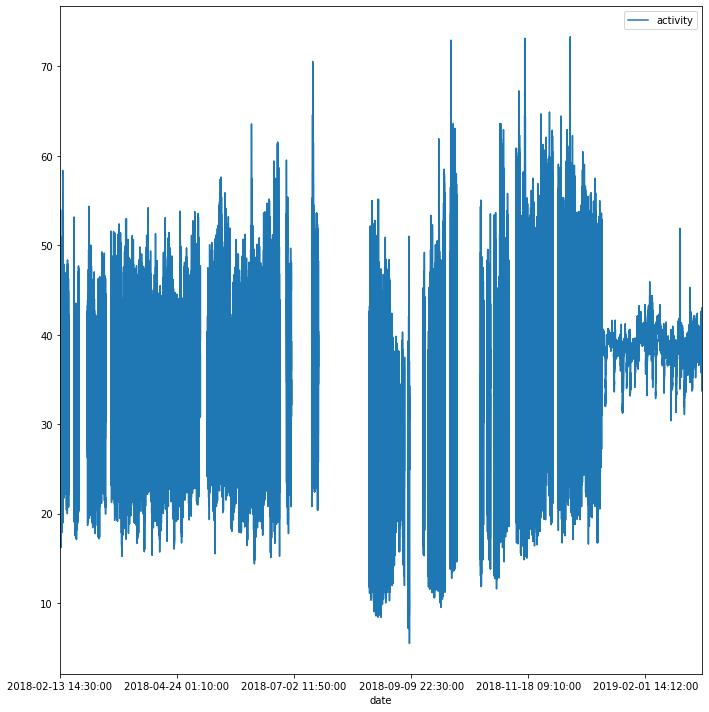

In [1240]:
plt.rcParams["figure.figsize"] = (10,10)

pd.merge(train_target, answer_LR,  how='outer').plot('date', 'activity')

# Rotate and align xtick labels
#ax.get_figure().autofmt_xdate()

# make room for tick labels
plt.tight_layout()
plt.axvspan(160, 186, facecolor='#2ca02c', alpha=0.5)

plt.show()

In [1241]:
answer_SGD = pd.DataFrame()
activity_SGD = [pred_list_SGD[i][0] for i in range(0, len(pred_list_SGD))]
answer_SGD = test_target[['date']]
answer_SGD['activity']=activity_SGD
answer_SGD.to_csv('catActivSGD.csv', sep=',', header=True, index=False)

!cat catActivSGD.csv
#!more catActivSGD.csv

date,activity
2019-01-01 00:30:00,40.02961451030874
2019-01-01 00:31:00,39.946948093017994
2019-01-01 00:32:00,39.99380772533122
2019-01-01 00:33:00,39.86941835371882
2019-01-01 00:34:00,39.99760171598165
2019-01-01 00:35:00,39.91008023797283
2019-01-01 00:36:00,39.99872183011709
2019-01-01 00:37:00,40.028588798951944
2019-01-01 00:38:00,40.107484287804965
2019-01-01 00:39:00,39.997228232605984
2019-01-01 00:40:00,39.981459254051515
2019-01-01 00:41:00,39.99835278507691
2019-01-01 00:42:00,40.04201140012788
2019-01-01 00:43:00,40.06655457594167
2019-01-01 00:44:00,40.077470837372836
2019-01-01 00:45:00,40.07384444628581
2019-01-01 00:46:00,40.09618205395661
2019-01-01 00:47:00,40.11012170526647
2019-01-01 00:48:00,40.23688479595849
2019-01-01 00:49:00,40.13013978345578
2019-01-01 00:50:00,40.15520702051587
2019-01-01 00:51:00,40.201837298761745
2019-01-01 00:52:00,40.154494722436105
2019-01-01 00:53:00,40.1322463681437
2019-01-01 00:54:00,40.26372038837653
2019-01-01 00:55:00,40.268478

2019-01-06 08:59:00,39.16773804175549
2019-01-06 09:00:00,39.195482877208036
2019-01-06 09:01:00,39.33374505294655
2019-01-06 09:02:00,39.3636942632328
2019-01-06 09:03:00,39.35963206439127
2019-01-06 09:04:00,39.27005852668989
2019-01-06 09:05:00,39.29870625232597
2019-01-06 09:06:00,39.21851612006726
2019-01-06 09:07:00,39.30076612293228
2019-01-06 09:08:00,39.29649120553479
2019-01-06 09:09:00,39.12630126466414
2019-01-06 09:10:00,39.078631426406744
2019-01-06 09:11:00,39.09591849341111
2019-01-06 09:12:00,38.992881937901004
2019-01-06 09:13:00,38.934494082135835
2019-01-06 09:14:00,39.01191254866755
2019-01-06 09:15:00,39.013153978352406
2019-01-06 09:16:00,38.99291459564579
2019-01-06 09:17:00,39.03370661105853
2019-01-06 09:18:00,39.015845349528036
2019-01-06 09:19:00,39.01267973132807
2019-01-06 09:20:00,39.10742029006952
2019-01-06 09:21:00,39.210651162942966
2019-01-06 09:22:00,39.173548039601606
2019-01-06 09:23:00,39.117775733286265
2019-01-06 09:24:00,39.06571767451949
2019

2019-01-21 01:14:00,36.646406729083154
2019-01-21 01:15:00,36.689923553794394
2019-01-21 01:16:00,36.70705879181537
2019-01-21 01:17:00,36.65104566646913
2019-01-21 01:18:00,36.66249375166673
2019-01-21 01:19:00,36.70552334576736
2019-01-21 01:20:00,36.739380777001664
2019-01-21 01:21:00,36.70810094391326
2019-01-21 01:22:00,36.66866305757878
2019-01-21 01:23:00,36.80219766031846
2019-01-21 01:24:00,36.727138106790065
2019-01-21 01:25:00,36.750068618199954
2019-01-21 01:26:00,36.78270638738334
2019-01-21 01:27:00,36.800812967135684
2019-01-21 01:28:00,36.755207077699716
2019-01-21 01:29:00,36.7130361261246
2019-01-21 01:30:00,36.76531458373663
2019-01-21 01:31:00,36.63831602462418
2019-01-21 01:32:00,36.65132471948488
2019-01-21 01:33:00,36.65786846336982
2019-01-21 01:34:00,36.750697307449556
2019-01-21 01:35:00,36.640332721396476
2019-01-21 01:36:00,36.598155528745096
2019-01-21 01:37:00,36.71427378738783
2019-01-21 01:38:00,36.63539534864896
2019-01-21 01:39:00,36.63126176913633
201

2019-01-27 20:36:00,40.418518177796685
2019-01-27 20:37:00,40.51451943141952
2019-01-27 20:38:00,40.4127001909188
2019-01-27 20:39:00,40.4192749269995
2019-01-27 20:40:00,40.49384288367382
2019-01-27 20:41:00,40.47228956751406
2019-01-27 20:42:00,40.407870277154004
2019-01-27 20:43:00,40.40207463820908
2019-01-27 20:44:00,40.51633946175579
2019-01-27 20:45:00,40.47110047629694
2019-01-27 20:46:00,40.37049496741862
2019-01-27 20:47:00,40.4166353515385
2019-01-27 20:48:00,40.41397656163086
2019-01-27 20:49:00,40.432188365971676
2019-01-27 20:50:00,40.51900418644012
2019-01-27 20:51:00,40.435327376241816
2019-01-27 20:52:00,40.440854660399246
2019-01-27 20:53:00,40.51433041428329
2019-01-27 20:54:00,40.58803279649063
2019-01-27 20:55:00,40.611583766589526
2019-01-27 20:56:00,40.651861772264674
2019-01-27 20:57:00,40.61823016708401
2019-01-27 20:58:00,40.599356546134324
2019-01-27 20:59:00,40.59359407732896
2019-01-27 21:00:00,40.61001939011916
2019-01-27 21:01:00,40.6458214185934
2019-01-

2019-02-04 05:11:00,43.71125553793529
2019-02-04 05:12:00,43.65557138289834
2019-02-04 05:13:00,43.812170711595606
2019-02-04 05:14:00,43.84079812851573
2019-02-04 05:15:00,43.82458817415353
2019-02-04 05:16:00,43.837072268330786
2019-02-04 05:17:00,43.77085660586365
2019-02-04 05:18:00,43.62258653811909
2019-02-04 05:19:00,43.58126048536545
2019-02-04 05:20:00,43.57944002561327
2019-02-04 05:21:00,43.60484214257646
2019-02-04 05:22:00,43.60017270945032
2019-02-04 05:23:00,43.60758249353341
2019-02-04 05:24:00,43.57287196890827
2019-02-04 05:25:00,43.28699636267645
2019-02-04 05:26:00,43.34855781991649
2019-02-04 05:27:00,43.317654686151414
2019-02-04 05:28:00,43.27280275049646
2019-02-04 05:29:00,43.36947008604275
2019-02-04 05:30:00,43.321591094025955
2019-02-04 05:31:00,43.42843816909227
2019-02-04 05:32:00,43.45519409101755
2019-02-04 05:33:00,43.334949854062344
2019-02-04 05:34:00,43.397440516151235
2019-02-04 05:35:00,43.310189905527686
2019-02-04 05:36:00,43.37564698175953
2019-

2019-02-12 15:53:00,38.047116552351135
2019-02-12 15:54:00,37.963354387770195
2019-02-12 15:55:00,37.95018838591217
2019-02-12 15:56:00,38.003926403186576
2019-02-12 15:57:00,38.12490578094962
2019-02-12 15:58:00,38.18975471137841
2019-02-12 15:59:00,38.15007291573325
2019-02-12 16:00:00,38.294954654776106
2019-02-12 16:01:00,38.223577625773025
2019-02-12 16:02:00,37.804427757038866
2019-02-12 16:03:00,37.83030794096828
2019-02-12 16:04:00,37.82865129834367
2019-02-12 16:05:00,37.87874959151002
2019-02-12 16:06:00,37.772043127412736
2019-02-12 16:07:00,37.7237113035791
2019-02-12 16:08:00,37.81958068760264
2019-02-12 16:09:00,37.871551156279835
2019-02-12 16:10:00,37.97408775198957
2019-02-12 16:11:00,38.00279844578149
2019-02-12 16:12:00,37.99390532116215
2019-02-12 16:13:00,37.91826669389963
2019-02-12 16:14:00,37.56575232173424
2019-02-12 16:15:00,36.628305459083094
2019-02-12 16:16:00,36.88535656231278
2019-02-12 16:17:00,37.324393793150584
2019-02-12 16:18:00,37.49408632532226
201

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



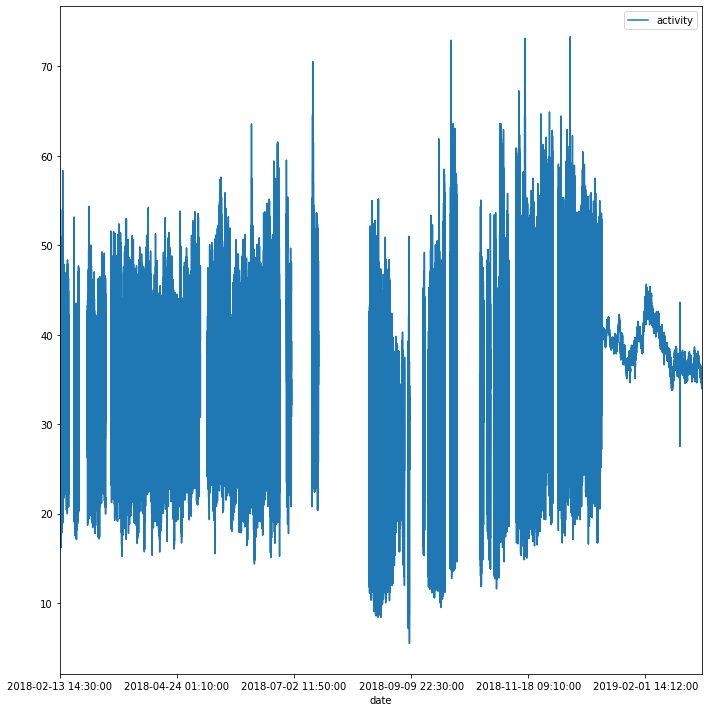

In [1242]:
plt.rcParams["figure.figsize"] = (10,10)

pd.merge(train_target, answer_SGD,  how='outer').plot('date', 'activity')

# Rotate and align xtick labels
#ax.get_figure().autofmt_xdate()

# make room for tick labels
plt.tight_layout()
plt.axvspan(160, 184, facecolor='#2ca02c', alpha=0.5)

plt.show()


In [1243]:
answer_GB = pd.DataFrame()
activity_GB = [pred_list_GB[i][0] for i in range(0, len(pred_list_GB))]
answer_GB = test_target[['date']]
answer_GB['activity']=activity_GB
answer_GB.to_csv('catActivGB.csv', sep=',', header=True, index=False)

!cat catActivGB.csv
#!more catActivGB.csv

date,activity
2019-01-01 00:30:00,39.76540270148982
2019-01-01 00:31:00,39.55979876541477
2019-01-01 00:32:00,39.55979876541477
2019-01-01 00:33:00,39.55979876541477
2019-01-01 00:34:00,39.503750324538835
2019-01-01 00:35:00,39.55979876541477
2019-01-01 00:36:00,39.76540270148982
2019-01-01 00:37:00,39.82080955430074
2019-01-01 00:38:00,39.82080955430074
2019-01-01 00:39:00,39.886954926637486
2019-01-01 00:40:00,39.82080955430074
2019-01-01 00:41:00,39.82080955430074
2019-01-01 00:42:00,39.886954926637486
2019-01-01 00:43:00,39.886954926637486
2019-01-01 00:44:00,39.886954926637486
2019-01-01 00:45:00,39.886954926637486
2019-01-01 00:46:00,39.886954926637486
2019-01-01 00:47:00,39.886954926637486
2019-01-01 00:48:00,39.83090648576155
2019-01-01 00:49:00,39.85144399749205
2019-01-01 00:50:00,39.62594413775152
2019-01-01 00:51:00,39.62594413775152
2019-01-01 00:52:00,39.62594413775152
2019-01-01 00:53:00,39.62594413775152
2019-01-01 00:54:00,39.62594413775152
2019-01-01 00:55:00,39.62594

2019-01-06 00:39:00,40.93471270966251

2019-01-06 00:41:00,40.937099346936584
2019-01-06 00:42:00,40.68146101675595
2019-01-06 00:43:00,40.59499456100743
2019-01-06 00:44:00,40.937099346936584
2019-01-06 00:45:00,40.89453425084053
2019-01-06 00:46:00,40.89453425084053
2019-01-06 00:47:00,40.80422772867004
2019-01-06 00:48:00,40.937099346936584
2019-01-06 00:49:00,40.95184482125184
2019-01-06 00:50:00,40.937099346936584
2019-01-06 00:51:00,40.53768399059612
2019-01-06 00:52:00,40.937099346936584
2019-01-06 00:53:00,40.41869227239134
2019-01-06 00:54:00,40.84984356416793
2019-01-06 00:55:00,40.89453425084053
2019-01-06 00:56:00,40.937099346936584
2019-01-06 00:57:00,40.937099346936584
2019-01-06 00:58:00,40.937099346936584
2019-01-06 00:59:00,40.937099346936584
2019-01-06 01:00:00,40.95184482125184
2019-01-06 01:01:00,40.89453425084053
2019-01-06 01:02:00,40.937099346936584
2019-01-06 01:03:00,40.93471270966251
2019-01-06 01:04:00,40.88256635202238
2019-01-06 01:05:00,40.794786924445354


2019-01-19 20:54:00,37.7595326956941
2019-01-19 20:55:00,37.7595326956941
2019-01-19 20:56:00,37.7595326956941
2019-01-19 20:57:00,37.7595326956941
2019-01-19 20:58:00,37.7595326956941
2019-01-19 20:59:00,37.7595326956941
2019-01-19 21:00:00,37.7595326956941
2019-01-19 21:01:00,37.7595326956941
2019-01-19 21:02:00,37.7595326956941
2019-01-19 21:03:00,37.7595326956941
2019-01-19 21:04:00,37.7595326956941
2019-01-19 21:05:00,37.7595326956941
2019-01-19 21:06:00,37.69338732335735
2019-01-19 21:07:00,37.7595326956941
2019-01-19 21:08:00,37.7595326956941
2019-01-19 21:09:00,37.84229175449667
2019-01-19 21:10:00,37.7595326956941
2019-01-19 21:11:00,37.7595326956941
2019-01-19 21:12:00,37.7595326956941
2019-01-19 21:13:00,37.7595326956941
2019-01-19 21:14:00,37.84229175449667
2019-01-19 21:15:00,37.7595326956941
2019-01-19 21:16:00,37.7595326956941
2019-01-19 21:17:00,37.7595326956941
2019-01-19 21:18:00,37.7595326956941
2019-01-19 21:19:00,37.7595326956941
2019-01-19 21:20:00,37.821435741739

2019-01-26 18:47:00,37.34414481459891
2019-01-26 18:48:00,37.30157971850286
2019-01-26 18:49:00,37.30157971850286
2019-01-26 18:50:00,37.34414481459891
2019-01-26 18:51:00,37.34414481459891
2019-01-26 18:52:00,37.34414481459891
2019-01-26 18:53:00,37.34414481459891
2019-01-26 18:54:00,37.34414481459891
2019-01-26 18:55:00,36.58257104521438
2019-01-26 18:56:00,37.580605594098294
2019-01-26 18:57:00,36.81903182471376
2019-01-26 18:58:00,37.34414481459891
2019-01-26 18:59:00,37.34414481459891
2019-01-26 19:00:00,36.58257104521438
2019-01-26 19:01:00,37.34414481459891
2019-01-26 19:02:00,37.34414481459891
2019-01-26 19:03:00,37.34414481459891
2019-01-26 19:04:00,37.34414481459891
2019-01-26 19:05:00,36.58257104521438
2019-01-26 19:06:00,37.34414481459891
2019-01-26 19:07:00,37.34414481459891
2019-01-26 19:08:00,37.11444813785474
2019-01-26 19:09:00,37.34414481459891
2019-01-26 19:10:00,36.46595016243067
2019-01-26 19:11:00,37.227523931815206
2019-01-26 19:12:00,37.227523931815206
2019-01-2

2019-02-03 18:51:00,38.78819525187058
2019-02-03 18:52:00,39.035479668516096
2019-02-03 18:53:00,38.832638207204326
2019-02-03 18:54:00,38.832638207204326
2019-02-03 18:55:00,39.27194044801548
2019-02-03 18:56:00,39.27194044801548
2019-02-03 18:57:00,38.78819525187058
2019-02-03 18:58:00,39.035479668516096
2019-02-03 18:59:00,39.27194044801548
2019-02-03 19:00:00,38.78819525187058
2019-02-03 19:01:00,39.035479668516096
2019-02-03 19:02:00,39.035479668516096
2019-02-03 19:03:00,39.035479668516096
2019-02-03 19:04:00,39.035479668516096
2019-02-03 19:05:00,38.96933429617935
2019-02-03 19:06:00,38.99612570935503
2019-02-03 19:07:00,38.96933429617935
2019-02-03 19:08:00,38.96933429617935
2019-02-03 19:09:00,38.96933429617935
2019-02-03 19:10:00,38.96933429617935
2019-02-03 19:11:00,38.96933429617935
2019-02-03 19:12:00,38.96933429617935
2019-02-03 19:13:00,38.96933429617935
2019-02-03 19:14:00,38.96933429617935
2019-02-03 19:15:00,38.96933429617935
2019-02-03 19:16:00,38.96933429617935
2019

2019-02-11 01:43:00,38.14492237452456
2019-02-11 01:44:00,38.14492237452456
2019-02-11 01:45:00,38.14492237452456
2019-02-11 01:46:00,38.14492237452456
2019-02-11 01:47:00,38.14492237452456
2019-02-11 01:48:00,38.14492237452456
2019-02-11 01:49:00,38.14492237452456
2019-02-11 01:50:00,38.14492237452456
2019-02-11 01:51:00,38.38138315402394
2019-02-11 01:52:00,38.14492237452456
2019-02-11 01:53:00,38.14492237452456
2019-02-11 01:54:00,38.14492237452456
2019-02-11 01:55:00,38.14492237452456
2019-02-11 01:56:00,38.14492237452456
2019-02-11 01:57:00,38.14492237452456
2019-02-11 01:58:00,38.14492237452456
2019-02-11 01:59:00,38.14492237452456
2019-02-11 02:00:00,38.59214768526885
2019-02-11 02:01:00,38.59214768526885
2019-02-11 02:02:00,38.59214768526885
2019-02-11 02:03:00,38.59214768526885
2019-02-11 02:04:00,38.59214768526885
2019-02-11 02:05:00,38.82860846476823
2019-02-11 02:06:00,38.59214768526885
2019-02-11 02:07:00,38.59214768526885
2019-02-11 02:08:00,38.59214768526885
2019-02-11 0

2019-02-20 22:13:00,33.9758056708541
2019-02-20 22:14:00,33.63060141746949
2019-02-20 22:15:00,33.63060141746949
2019-02-20 22:16:00,33.63060141746949
2019-02-20 22:17:00,33.928571490666386
2019-02-20 22:18:00,33.82286195816088
2019-02-20 22:19:00,33.63060141746949
2019-02-20 22:20:00,33.63060141746949
2019-02-20 22:21:00,33.82286195816088
2019-02-20 22:22:00,33.82286195816088
2019-02-20 22:23:00,33.63060141746949
2019-02-20 22:24:00,33.770338607389576
2019-02-20 22:25:00,33.96259914808096
2019-02-20 22:26:00,33.96259914808096
2019-02-20 22:27:00,34.06830868058647
2019-02-20 22:28:00,33.770338607389576
2019-02-20 22:29:00,33.62893437394843
2019-02-20 22:30:00,33.770338607389576
2019-02-20 22:31:00,33.9758056708541
2019-02-20 22:32:00,33.9758056708541
2019-02-20 22:33:00,33.9758056708541
2019-02-20 22:34:00,33.9758056708541
2019-02-20 22:35:00,34.16806621154549
2019-02-20 22:36:00,33.83606848093402
2019-02-20 22:37:00,33.91413899144514
2019-02-20 22:38:00,33.63060141746949
2019-02-20 22

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



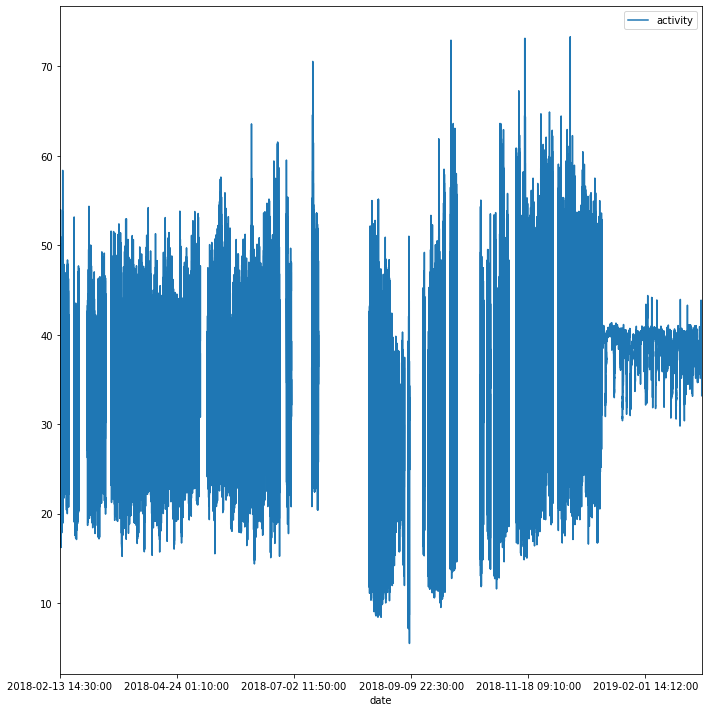

In [1244]:
plt.rcParams["figure.figsize"] = (10,10)

pd.merge(train_target, answer_GB,  how='outer').plot('date', 'activity')

# Rotate and align xtick labels
#ax.get_figure().autofmt_xdate()

# make room for tick labels
plt.tight_layout()
plt.axvspan(160, 184, facecolor='#2ca02c', alpha=0.5)

plt.show()


### За финальный результат принимаем данные catActivSGD.csv